### Description:

In this notebook, we will compute the IOU for the Yolo nas default and predicted.......

In [1]:
### run only once 

# pip install -q super-gradients==3.1.1
# pip install torchinfo
####

In [2]:
from iou_utils_NAS import *
import warnings
warnings.filterwarnings("ignore")


[2023-11-01 00:00:32] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /Users/mautushid/sg_logs/console.log


[2023-11-01 00:00:33] WARNING - redirects.py - NOTE: Redirects are currently not supported in Windows or MacOs.
[2023-11-01 00:00:35] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-11-01 00:00:35] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-11-01 00:00:35] WARNING - export.py - Failed to import pytorch_quantization
[2023-11-01 00:00:35] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-11-01 00:00:35] WARNING - env_sanity_check.py - Failed to verify operating system: Deci officially supports only Linux kernels. Some features may not work as expected.


In [3]:
DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
#MODEL_ARCH = 'yolo_nas_l'

In [4]:
DEVICE

'cpu'

In [5]:
### Dataset Directory
data_directory = '/Users/mautushid/github/AI_project/data'
dataset_params['data_dir'] = data_directory

In [6]:

### Loading ground truth data (bounding box information)
test_images = "/Users/mautushid/github/AI_project/data/test/test_img"
test_labels = "/Users/mautushid/github/AI_project/data/test/testyolo"

### defining prediction output directory 
#output_dir_default = "/Users/mautushid/github/Yolo_Nas/predicted_test/predicted_test_default"
#output_dir_fintuned = "/Users/mautushid/github/Yolo_Nas/predicted_test/predicted_test_finetuned"

### Load the model (default Yolo_Nas_L)
yolo_nas_l = models.get("yolo_nas_l", pretrained_weights="coco").to(DEVICE)

### Loading model (after fine-tuning)
model_path = '/Users/mautushid/github/AI_project/checkpoints/yolonas_AI/ckpt_best.pth'
best_model = models.get('yolo_nas_l',num_classes=6,checkpoint_path=model_path)

[2023-11-01 00:00:35] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-11-01 00:00:37] INFO - checkpoint_utils.py - Successfully loaded model weights from /Users/mautushid/github/AI_project/checkpoints/yolonas_AI/ckpt_best.pth EMA checkpoint.


In [7]:
### making predictions for default model
#predicted_image_list_default = show_predicted_images_from_dir(yolo_nas_l, test_images, conf = 0.6)

In [8]:
### making predictions for finetuned model
#predicted_image_list_finetuned = show_predicted_images_from_dir(best_model, test_images, conf = 0.60)

### Get bounding boxes of the predicted images

In [9]:
def get_boxex_for_all_models_car(
    image_path, image_label, default_model, finetuned_model, conf=0.6
):
   
    image_name = image_path
    ### get bounding boxes
    # in case of ground truth (no model prediction)
    gt_boxes = cxcyxy_to_xyxy(image_label, image_path)
    # in case of default yolo_nas
    default_model_boxes = get_boxes_xyxy(default_model, image_path, conf)
    # in case of finetned yolo_nas
    finetuned_model_boxes = get_boxes_xyxy(finetuned_model, image_path, conf)

    prediction_dict = {}

    prediction_dict["image"] = image_name
    prediction_dict["Ground_Truth_boxes"] = gt_boxes
    prediction_dict["Default_YoloNas_boxes"] = default_model_boxes
    prediction_dict["Finetuned_YoloNas_boxes"] = finetuned_model_boxes

    return prediction_dict

/Users/mautushid/github/AI_project/data/test/test_img/1.jpg


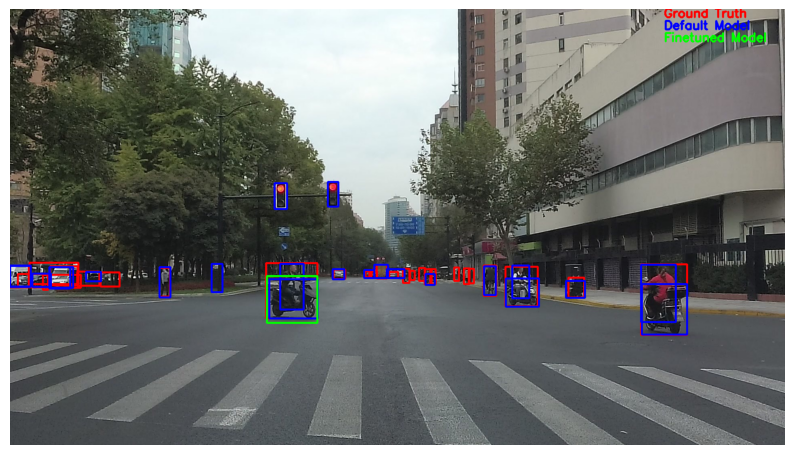

/Users/mautushid/github/AI_project/data/test/test_img/10.jpg


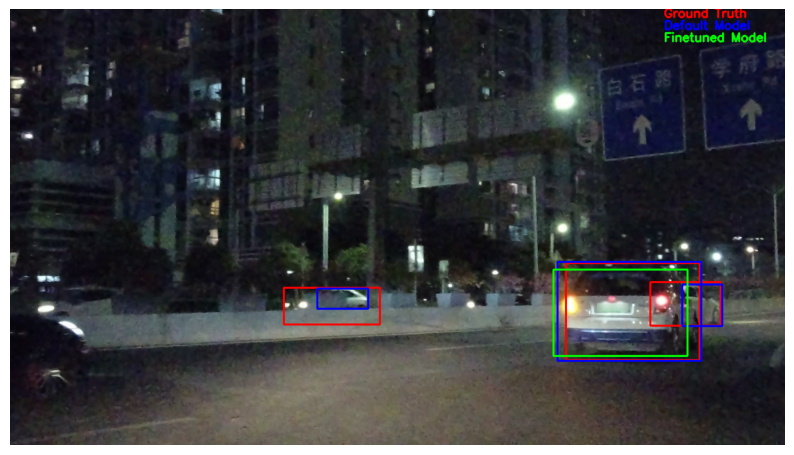

/Users/mautushid/github/AI_project/data/test/test_img/11.jpg


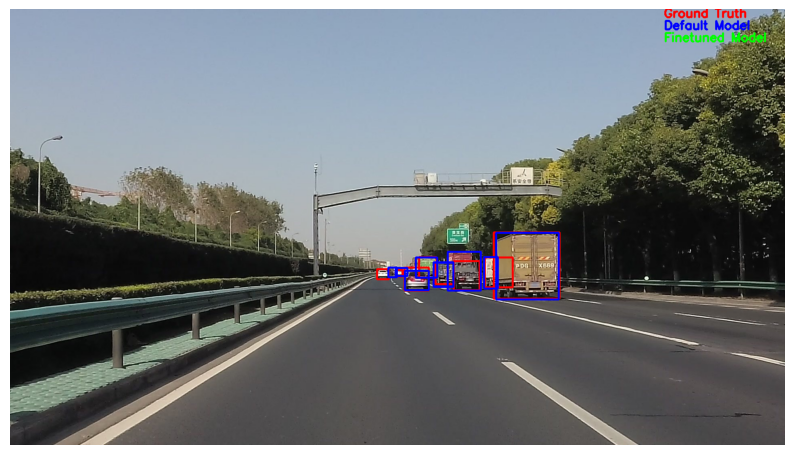

/Users/mautushid/github/AI_project/data/test/test_img/12.jpg


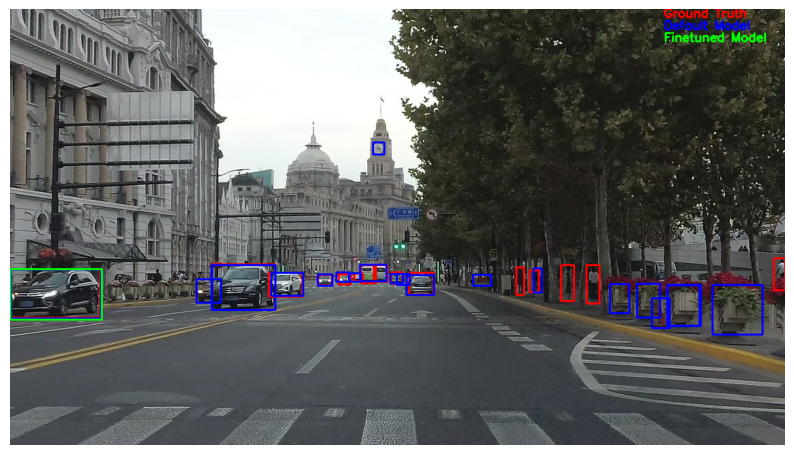

/Users/mautushid/github/AI_project/data/test/test_img/13.jpg


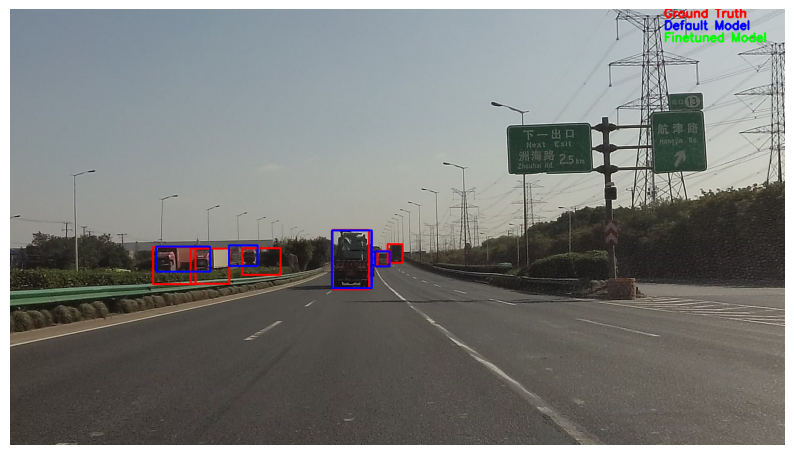

/Users/mautushid/github/AI_project/data/test/test_img/14.jpg


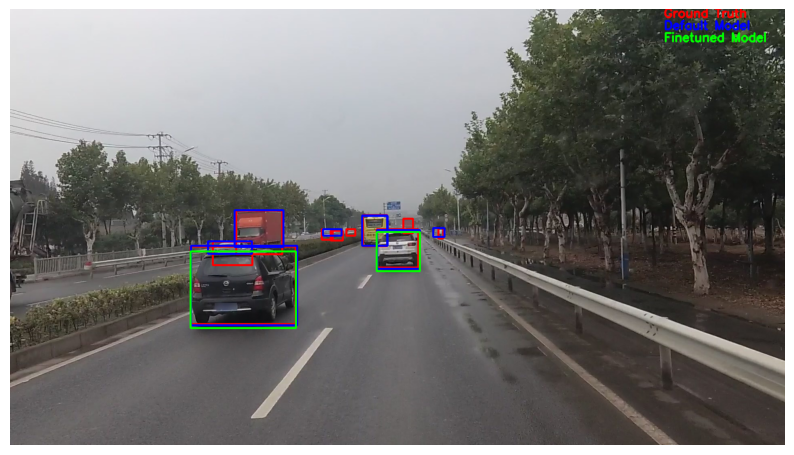

/Users/mautushid/github/AI_project/data/test/test_img/15.jpg


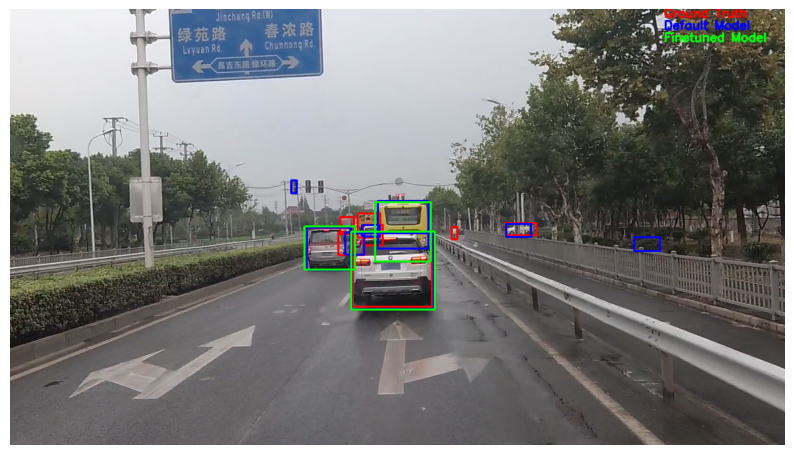

/Users/mautushid/github/AI_project/data/test/test_img/16.jpg


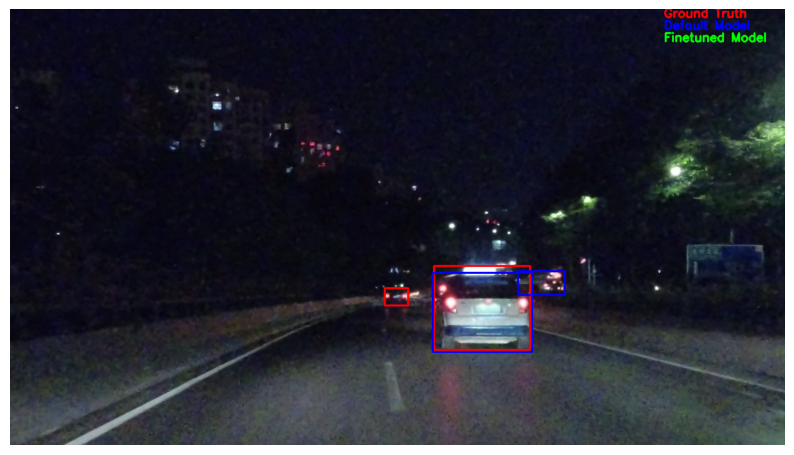

/Users/mautushid/github/AI_project/data/test/test_img/17.jpg


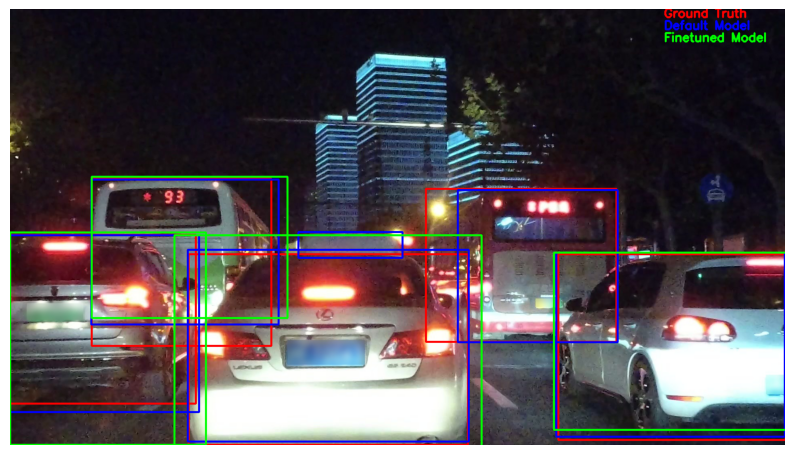

/Users/mautushid/github/AI_project/data/test/test_img/18.jpg


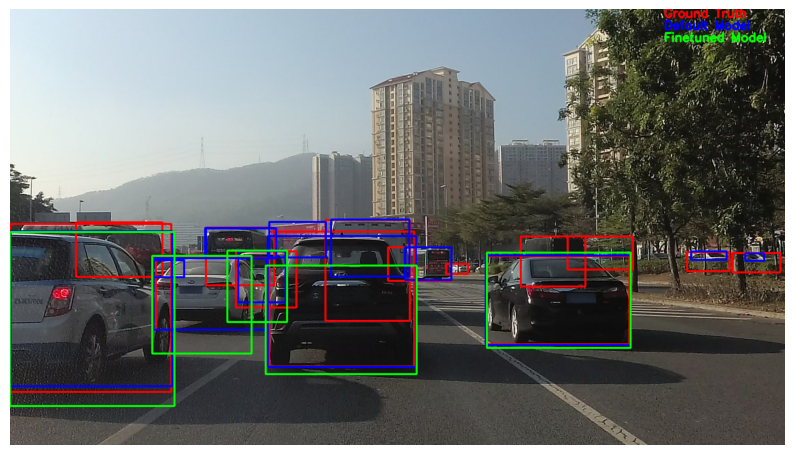

/Users/mautushid/github/AI_project/data/test/test_img/19.jpg


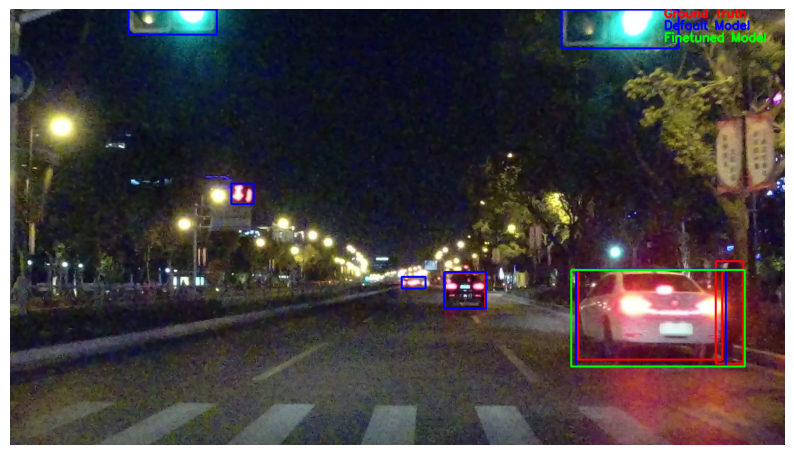

/Users/mautushid/github/AI_project/data/test/test_img/2.jpg


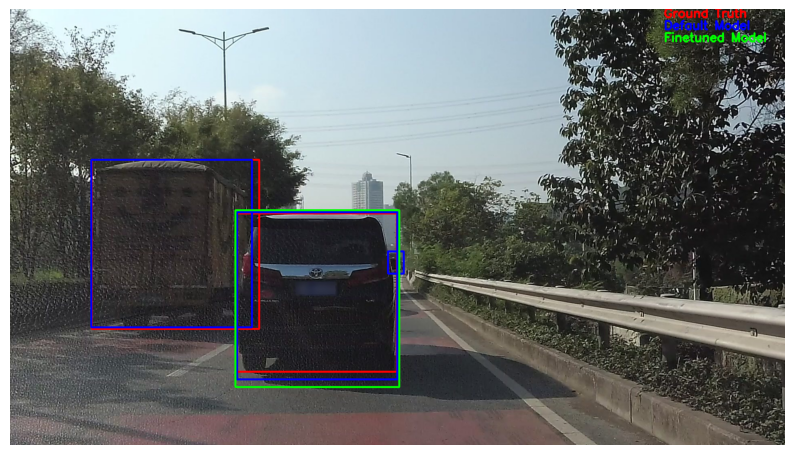

/Users/mautushid/github/AI_project/data/test/test_img/20.jpg


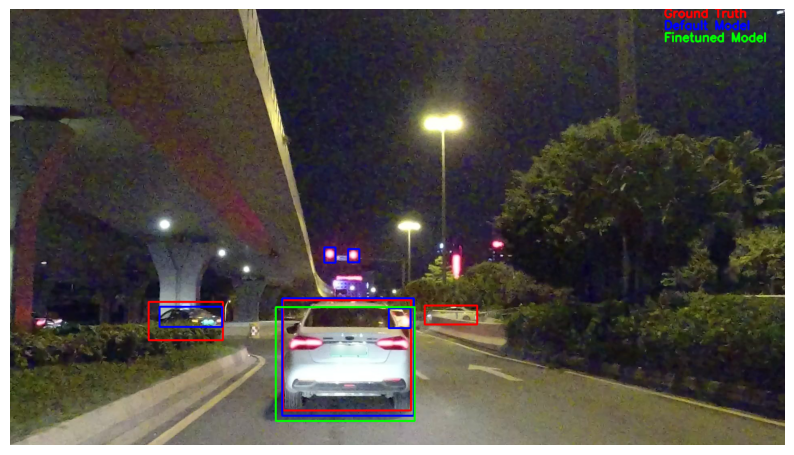

/Users/mautushid/github/AI_project/data/test/test_img/3.jpg


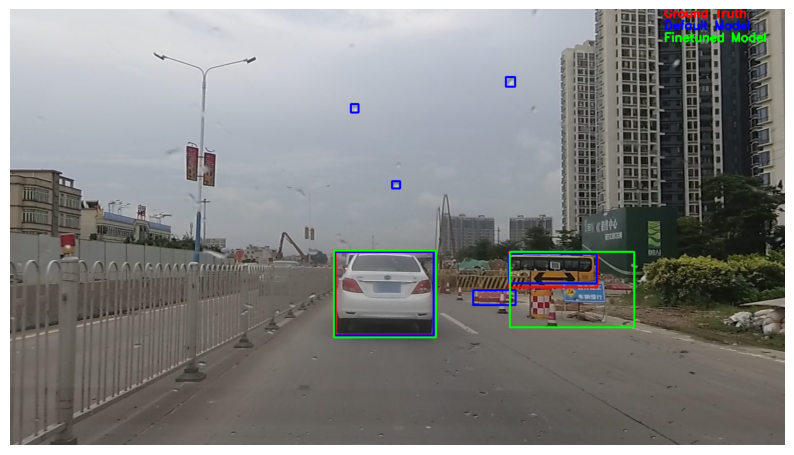

/Users/mautushid/github/AI_project/data/test/test_img/4.jpg


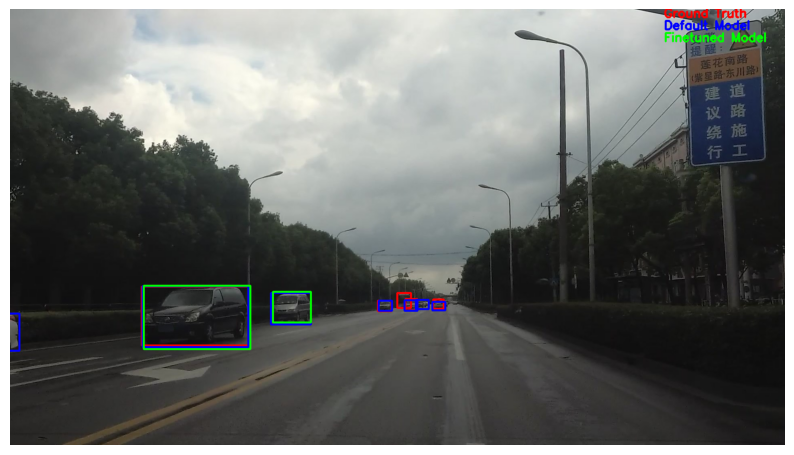

/Users/mautushid/github/AI_project/data/test/test_img/5.jpg


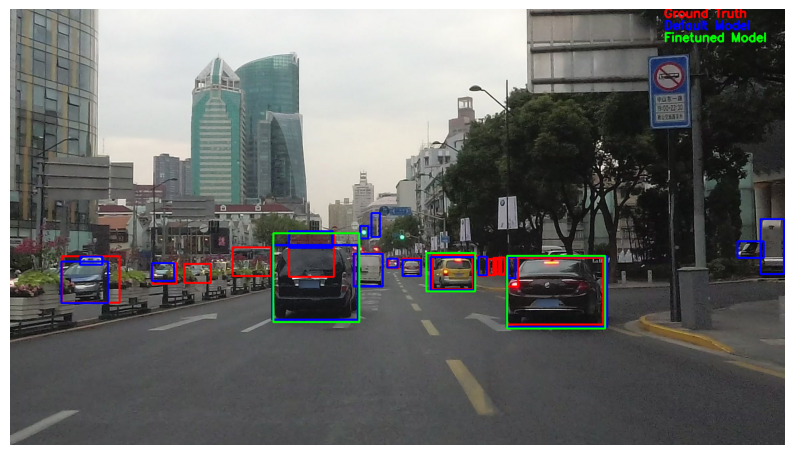

/Users/mautushid/github/AI_project/data/test/test_img/6.jpg


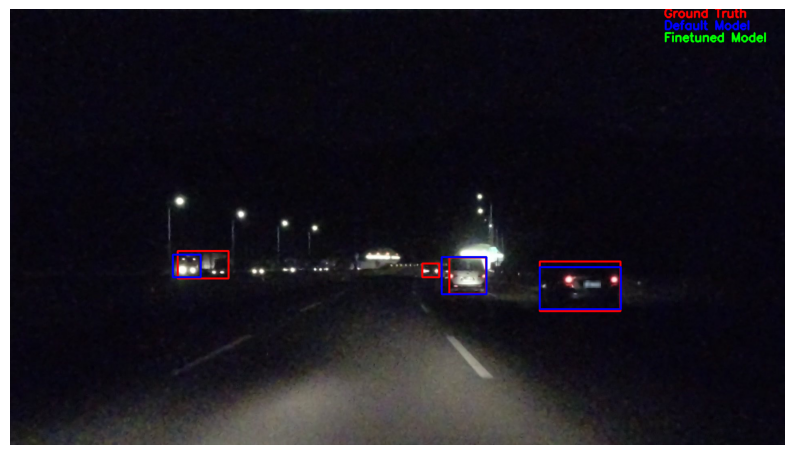

/Users/mautushid/github/AI_project/data/test/test_img/7.jpg


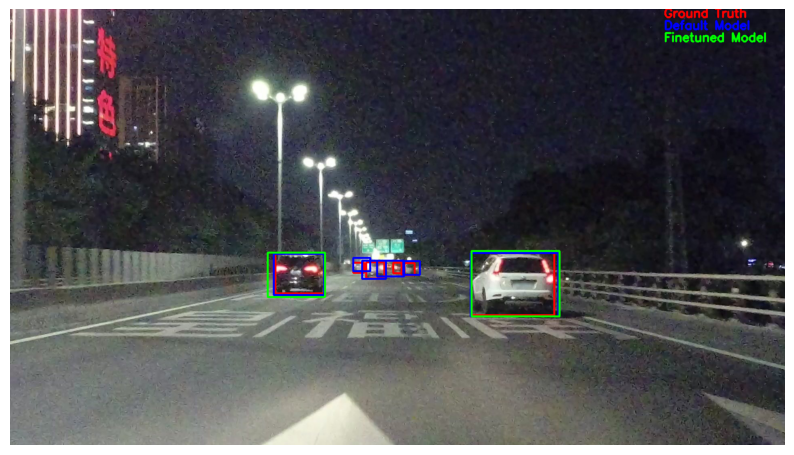

/Users/mautushid/github/AI_project/data/test/test_img/8.jpg


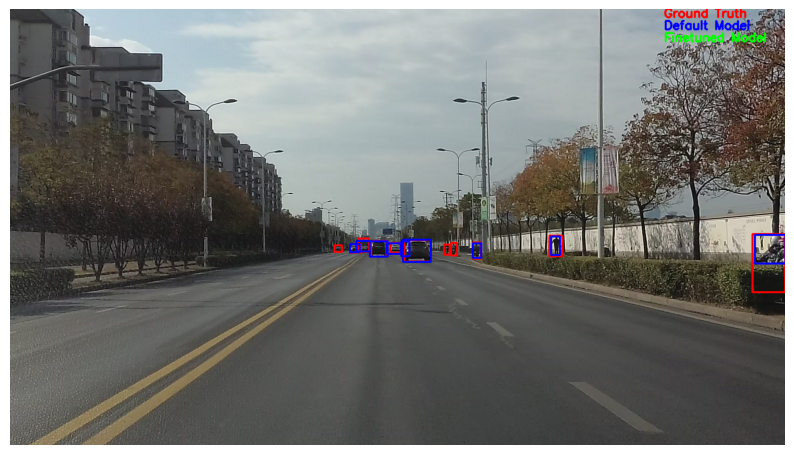

/Users/mautushid/github/AI_project/data/test/test_img/9.jpg


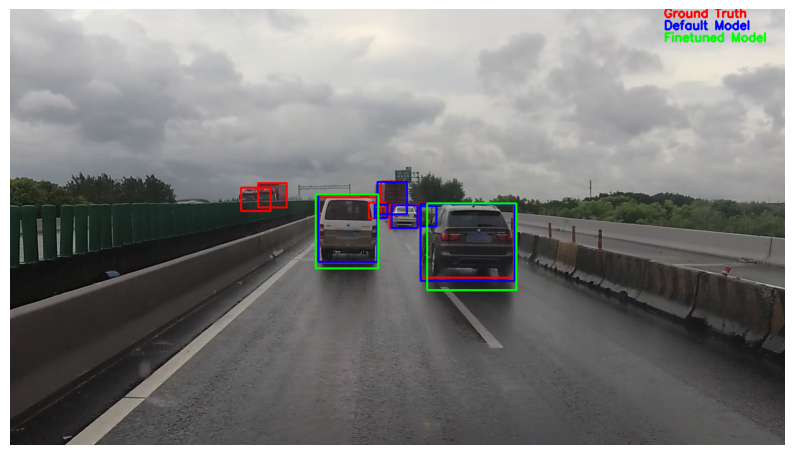

In [10]:
image_files = sorted(list(Path(test_images).rglob("*.jpg")))
label_files = sorted(list(Path(test_labels).rglob("*.txt")))

default_model = yolo_nas_l
finetuned_model = best_model 
iou_dicts = []
for i in range (len(image_files)):
    test_image_path = str(image_files[i])
    test_image_label = str(label_files[i])
    prediction_dict = get_boxex_for_all_models_car(test_image_path,test_image_label,default_model,finetuned_model, conf = 0.3)
    print(prediction_dict['image'])
    #iou_dicts.append(compute_iou_for_all_models(prediction_dict))
    draw_boxes_all_models(test_image_path, prediction_dict)
    

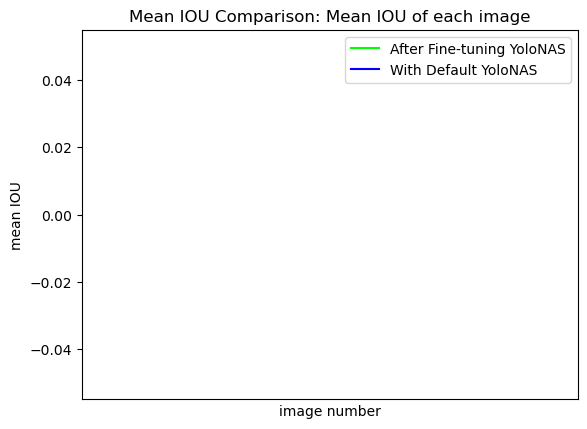

In [11]:
### Compute mean_IoU for both models for all images

x = list(range(1, len(iou_dicts)+1))
y1 = [np.mean(iou_dicts[i]['IOU_with_finetuned_YoloNAS'])for i in range(len(iou_dicts))]
y2 = [np.mean(iou_dicts[i]['IOU_with_default_YoloNAS']) for i in range(len(iou_dicts))]

# Plot the first dictionary in blue and the second in red
plt.plot(x, y1, color='lime', label='After Fine-tuning YoloNAS')
plt.plot(x, y2, color='blue', label='With Default YoloNAS')

# Add labels and title to the plot
plt.legend()

plt.xlabel('image number')
plt.ylabel('mean IOU')
plt.title('Mean IOU Comparison: Mean IOU of each image')
plt.xticks(range(1, len(iou_dicts) + 1))
# Show the plot
plt.show()
